In [30]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [31]:
path: str = "/home/USER/Documents/Uni/WiSe2223/Consulting/mlw-consulting-project/data/processed/test_predictions_swin_gpt2_aug_abl_index.xlsx"

In [32]:
df = pd.read_excel(path)

In [33]:
df

,Unnamed: 0,id,Label,Prediction,CER,Correct,Model
0,0,44873,sequor,sequor,0.0,1,SWIN+GPT-2 (Best)
1,1,77873,soror,soror,0.0,1,SWIN+GPT-2 (Best)
2,2,223354,ubi,ubi,0.0,1,SWIN+GPT-2 (Best)
3,3,55972,similis,similis,0.0,1,SWIN+GPT-2 (Best)
4,4,196145,velut,velut,0.0,1,SWIN+GPT-2 (Best)
...,...,...,...,...,...,...,...
17163,17163,230389,tempus,tempus,0.0,1,SWIN+GPT-2 (Best)
17164,17164,304205,ne,ne,0.0,1,SWIN+GPT-2 (Best)
17165,17165,296931,mos,mos,0.0,1,SWIN+GPT-2 (Best)
17166,17166,3828,sacramentalis,sacramentalis,0.0,1,SWIN+GPT-2 (Best)


In [34]:
df["Len"] = list(map(len, df.Label.values))

In [35]:
df_incorrect = df[df.Correct == 0].copy()

In [36]:
df_incorrect[df_incorrect.Label.str.contains('^-')]

,Unnamed: 0,id,Label,Prediction,CER,Correct,Model,Len
137,137,223590,-ve,vel,0.666667,0,SWIN+GPT-2 (Best),3
8957,8957,223656,-ve,vel,0.666667,0,SWIN+GPT-2 (Best),3


In [37]:
len(df[df.Label.str.contains('^-')]), len(df_incorrect[df_incorrect.Label.str.contains('^-')])

(82, 2)

In [38]:
np.mean(df.Len.values), np.mean(df_incorrect.Len.values)

(5.47145852749301, 7.58)

In [39]:
df["b"] = ["True" if bool(e) else "False" for e in df.Correct.values ]

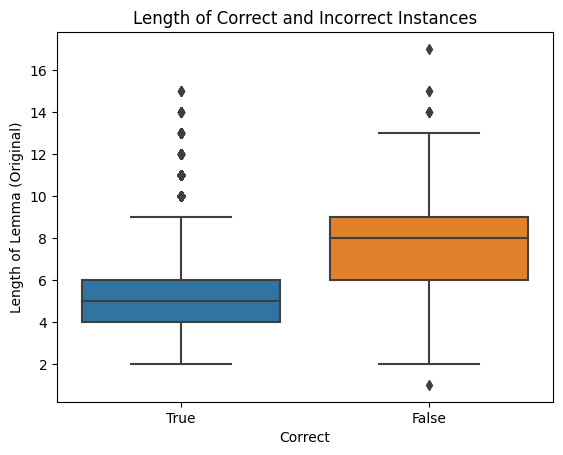

In [40]:
sns.boxplot(data=df, x='b', y='Len')
plt.title("Length of Correct and Incorrect Instances")
plt.ylabel("Length of Lemma (Original)")
plt.xlabel("Correct")
plt.show()

In [41]:
df_incorrect[df_incorrect['CER'] > 1.0]

,Unnamed: 0,id,Label,Prediction,CER,Correct,Model,Len
21,21,221497,u,si,2.000000,0,SWIN+GPT-2 (Best),1
636,636,106992,sui,tribi,1.333333,0,SWIN+GPT-2 (Best),3
1397,1397,114464,sum,superus,1.666667,0,SWIN+GPT-2 (Best),3
1543,1543,218448,ut,utilitas,3.000000,0,SWIN+GPT-2 (Best),2
2095,2095,225619,uter,ultimus,1.250000,0,SWIN+GPT-2 (Best),4
2955,2955,215629,vos,vestum,1.333333,0,SWIN+GPT-2 (Best),3
3501,3501,108578,sum,sacro,1.333333,0,SWIN+GPT-2 (Best),3
4443,4443,125332,sus,susceptio,2.000000,0,SWIN+GPT-2 (Best),3
6914,6914,304040,ne,via,1.500000,0,SWIN+GPT-2 (Best),2
7552,7552,233479,tollo,suffer,1.200000,0,SWIN+GPT-2 (Best),5


In [2]:
from PIL import Image
from os.path import join

In [3]:
path_data = "/home/USER/Documents/Uni/WiSe2223/Consulting/mlw-consulting-project/data/interim/lemmata_img/images"

In [4]:
path_data_stathd = "/home/USER/Documents/Uni/WiSe2223/Consulting/mlw-consulting-project/data/StatHD/MLW/zettel/"

# 131331 - suus

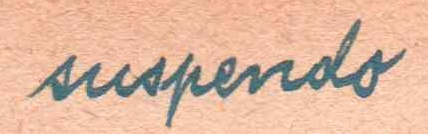

In [8]:
Image.open(join(path_data, '131331.jpg'))

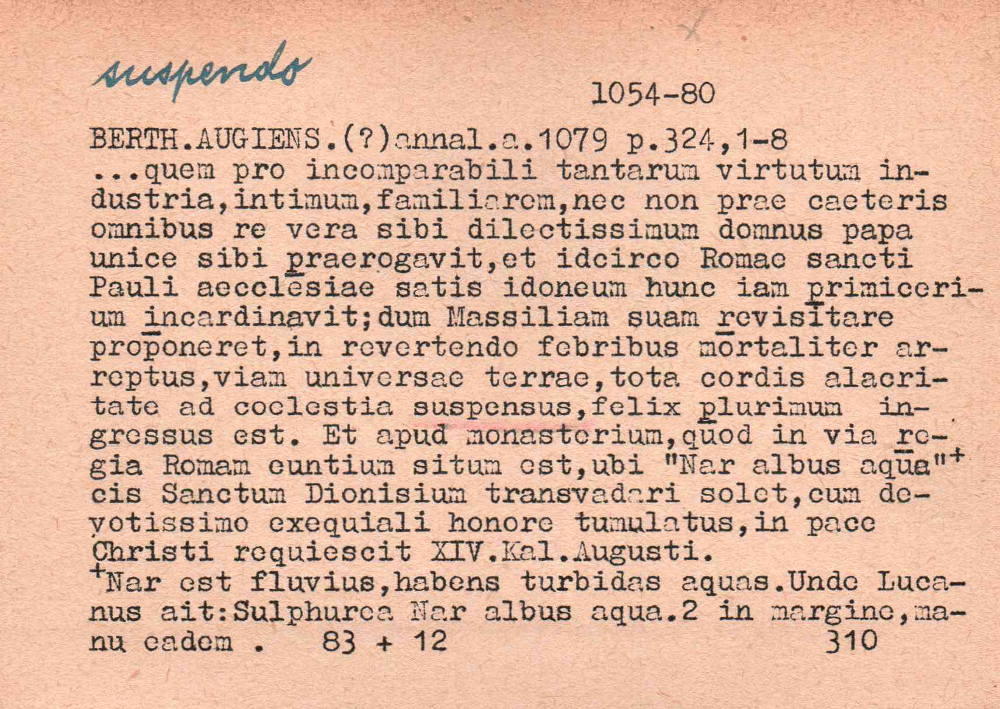

In [10]:
Image.open(join(path_data_stathd, '131331.jpg'))

# 4136	- sacro

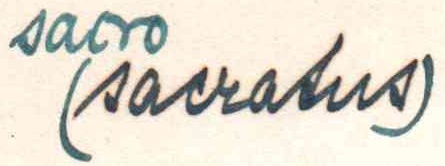

In [51]:
Image.open(join(path_data, '4136.jpg'))

In [53]:
Image.open(join(path_data_stathd, '4136.jpg'))

# 218448 - ut

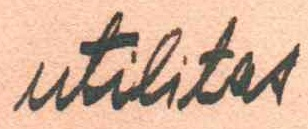

In [47]:
Image.open(join(path_data, '218448.jpg'))

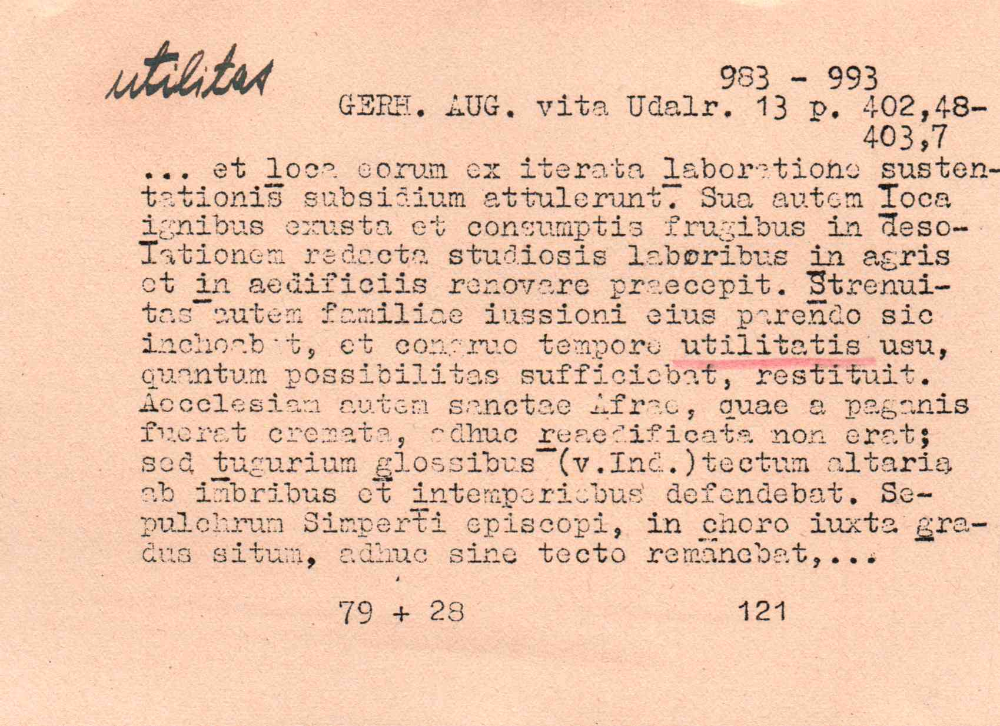

In [50]:
Image.open(join(path_data_stathd, '218448.jpg'))

# 31079 - sed

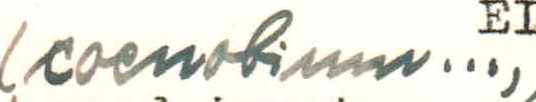

In [45]:
Image.open(join(path_data, '31079.jpg'))

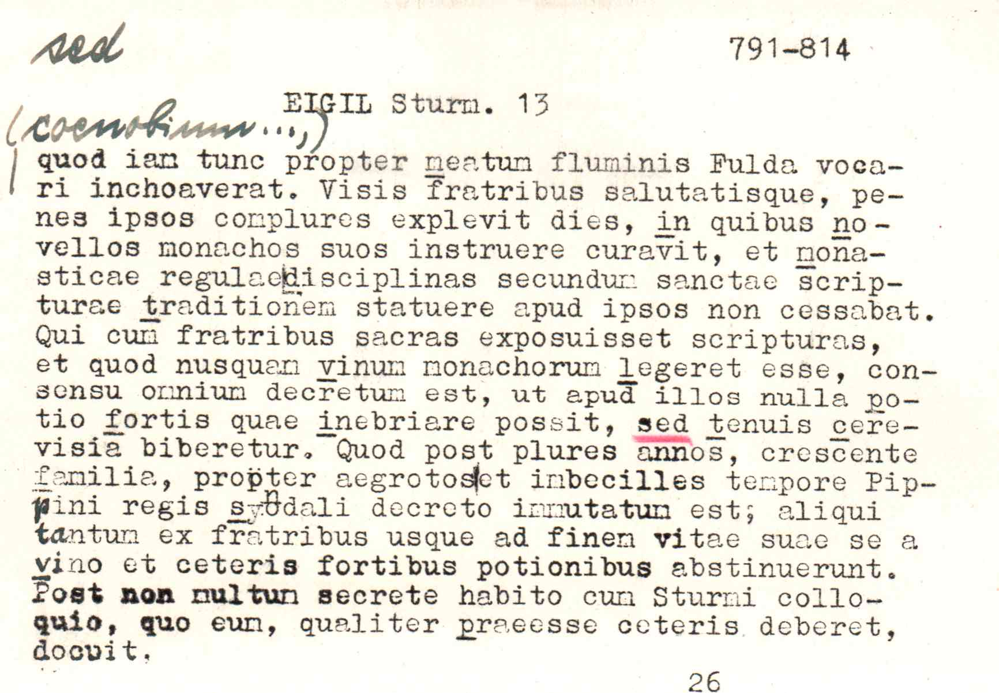

In [52]:
Image.open(join(path_data_stathd, '31079.jpg'))

In [42]:
len(df_incorrect[df_incorrect['CER'] > 1.0]), len(df_incorrect[df_incorrect['CER'] > 1.0]) / len(df_incorrect)

(16, 0.032)